# miχPODS: New baseline


## TODO 

- [ ] why does the stability diagram load multiple times
- [ ] Is there an error in ONI phase labeling for the newer runs, presumably SST changed some.
- [ ] Add diagnostic for convective "adjustment" or `diff == 1`

  

## Introduction

Analysis of χpod shear mixing measurements recorded over approximately 15 years
has revealed that mixing varies on multiple timescales, from hourly to interannual, in the
tropical Pacific and Indian Oceans (Moum, 2021; Cherian et al., 2020b; Warner et al., 2016;
Warner and Moum, 2019; Pujiana et al., 2018; Moum et al., 2009, 2013). These results
show that equatorial mixing is organized in large-scale coherent patterns.

We pask whether these patterns,  a decade-long observed mixing dataset (from χpods) to
develop mixing process-oriented diagnostics (miχPODs) that assess the variability of
parameterized equatorial mixing from monthly to decadal timescales; and its accumu-
lated impact on model biases by applying miχPODs to a suite of existing CMIP6-class
forced ocean and coupled model experiments from NCAR and GFDL.

Following Large and Gent (1999), the comparison of a 1D
mixing model with LES or DNS is clean, because the forcing is the same, and direct, because
the evaluation compares turbulence quantities (despite shortcomings such as model errors
and idealized forcing). In contrast, the performance of a mixing scheme in global and
regional model simulations is tested by comparing the simulated mean state to an observed
mean state after a long integration (for e.g. Blanke and Delecluse, 1993; Robitaille and
Weaver, 1995; Large and Gent, 1999; Gutjahr et al., 2020). This comparison is not clean,
because of errors in forcing fields, nor is it direct, since mean state properties are not a direct
output of the mixing scheme.

We propose diagnostics that evaluate the representation of the variability in
parameterized equatorial mixing using the multiyear χpod turbulence dataset. While
this comparison is *not clean*, it is *direct*, a substantial improvement to the current
state-of-the-art approach.

These diagnostics are direct evaluations of the models’ ability to
simulate the observed variability of ocean vertical mixing and reproduce large-scale
patterns recorded in equatorial mixing observations. 



## Parameters

- **TODO** write down KPP and Jochum equations

- **TODO** something about total diffusivity field in model. Total diffusivity $K = K_D + K_{KPP}$. and mapping from physical process to parameterization.

We perturb the following parameters
1. "Background mixing" parameters used to simulate mixing by unresolved processes such as breaking internal waves.
    1. A latitudinal varying background diffusivity $K_D$ using the formulation by Jochum (2003)
    2. A latitudinal varying background viscosity $K_V'$ derived from $K_D$ using a Prandtl number of 5 (CHECK). 
    3. A constant background viscosity $K_V$ added to (2).
2. KPP Boundary layer scheme:
    1. Bulk Richardson number criterion $Ri_c$ which controls the depth of the actively mixing layer.
3. KPP shear mixing scheme:
    1. Critical Richardson number $Ri_0$ that controls when mixing occurs.
    2. Maximum shear mixing viscosity $ν_0$

Choices for the parameter changes were influenced by experiments matching 1D KPP simulations to the Large Eddy Simulations of Whitt et al (2022).
The range of parameter values explored here is not exhaustive and is only intended to demonstrate the utility of these metrics in tuning and assessing model performance.

## Datasets

### Observations

1. TAO $T, S, u, v$ and turbulence (Moum et al XXX)

- Note which depth χpods are being used
- Add a figure showing sampling and gaps


### Model Simulations

The effect of these parameter changes are examined in a IPCC-class climate model: the development version of Community Earth System Model version 3 (CESM3), using the Modular Ocean Model version 6 (MOM6) ocean component, and the K Profile Paramerization vertical mixing scheme (Large et al., 1994).

For all simulations, we save a large number of variables every time step, which is an hour.


1. "old" baseline with KD=1e-5, KV=2e-4 (https://github.com/NCAR/MOM6/issues/238)
1. old baseline + `kpp.lmd.004`  with `KPP ν0=2.5, Ric=0.2, Ri0=0.5`
1. new baseline : `KD=0, KV=0`
1. new baseline : `kpp.lmd.004`  with `KPP ν0=2.5, Ric=0.2, Ri0=0.5`
1. new baseline : `kpp.lmd.005`  with `KPP ν0=2.5, Ric=0.3, Ri0=0.5`

## Summary

1. Turning down the background visc by a factor of 40, (2e-4 → 5e-5 m2/s)
    1. sharpens the EUC relative to TAO
    1. changes the stability diagram for El-Nino warming phase.
2. Using `Ri_c=0.2`, so shallower KPP surface layer, is key as Dan mentioned.

## Setup

In [1]:
%load_ext autoreload
%load_ext rich
%load_ext watermark

%xmode minimal

import math
import warnings
import os

import cf_xarray as cfxr
import dcpy.datatree  # noqa
import distributed
import holoviews as hv
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tqdm
from datatree import DataTree

import xarray as xr

%aimport pump
from holoviews.plotting.bokeh.util import select_legends

from pump import mixpods

hv.notebook_extension("bokeh")

cfxr.set_options(warn_on_missing_variables=False)
xr.set_options(keep_attrs=True, display_expand_data=False)

plt.style.use("bmh")
plt.rcParams["figure.dpi"] = 140

# https://github.com/dask/distributed/issues/8022
import warnings
import bokeh

# warnings.simplefilter("ignore", bokeh.util.warnings.BokehUserWarning)
import datatree


%watermark -iv

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Exception reporting mode: Minimal


/glade/u/home/dcherian/miniconda3/envs/pump/lib/python3.10/site-packages/dask_jobqueue/core.py:20: FutureWarning: tmpfile is deprecated and will be removed in a future release. Please use dask.utils.tmpfile instead.
  from distributed.utils import tmpfile


holoviews  : 1.17.0
distributed: 2023.8.0
dcpy       : 0.1.dev387+gd06c937
xarray     : 2023.7.0
pandas     : 2.0.3
numpy      : 1.24.4
bokeh      : 3.2.2
datatree   : 0.0.12
cf_xarray  : 0.8.4
tqdm       : 4.66.1
pump       : 1.0+273.g892024e.dirty
matplotlib : 3.7.1



In [2]:
if "client" in locals():
    client.close()  # noqa
    del client  # noqa
if "cluster" in locals():
    cluster.close()  # noqa

import ncar_jobqueue

cluster = ncar_jobqueue.NCARCluster(
    local_directory="/local_scratch/pbs.$PBS_JOBID/dask/spill",
)
cluster.adapt(minimum_jobs=2, maximum_jobs=8)
client = distributed.Client(cluster)
client

Connection method: Cluster object,Cluster type: dask_jobqueue.PBSCluster
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/dcherian/casper/proxy/8787/status,
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/dcherian/casper/proxy/8787/status,Workers: 0
Total threads: 0,Total memory: 0 B
Comm: tcp://10.12.206.31:36719,Workers: 0
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/dcherian/casper/proxy/8787/status,Total threads: 0
Started: Just now,Total memory: 0 B


## Read

### MOM6

#### Look at catalog

The catalog only contains surface variables, full depth variables, NO SECTIONS YET.

In [5]:
catalog = pump.catalog.open_mom6_catalog()
catalog

,unique
casename,11
stream,5
path,41
baseline,2
levels,2
frequency,3
variables,85
shortname,11
description,9
derived_variables,0


In [6]:
catalog.df["shortname"].unique()


array(['baseline', 'kpp.lmd.004', 'baseline.001', 'baseline.epbl.001',
       'baseline.hb', 'baseline.kpp.lmd.002', 'baseline.kpp.lmd.003',
       'baseline.kpp.lmd.004', 'new_baseline.hb',
       'new_baseline.kpp.lmd.004', 'new_baseline.kpp.lmd.005'],
      dtype=object)

#### Subset catalog

```{note}
Use `baseline.hb` instead of `baseline.001`. This was run by Anna-Lena, and does not have gaps, and has heat budget output.
```

In [7]:
catalog_sub = pd.concat(
    [
        cat.df
        for cat in [
            # pick two "old" baseline simulations
            catalog.search(
                stream="combined",
                levels=65,
                shortname=["baseline.hb", "baseline.kpp.lmd.004"],
            ),
            # and all new baseline simulations
            catalog.search(stream="combined", levels=65, baseline="new"),
        ]
    ]
)

with pd.option_context("display.max_colwidth", None):
    display(catalog_sub[["shortname", "casename", "path"]])

,shortname,casename,path
0,baseline.hb,gmom.e23.GJRAv3.TL319_t061_zstar_N65.baseline.hb,/glade/campaign/cgd/oce/projects/pump/cesm/gmom.e23.GJRAv3.TL319_t061_zstar_N65.baseline.hb/run/jsons/combined.json
1,baseline.kpp.lmd.004,gmom.e23.GJRAv3.TL319_t061_zstar_N65.baseline.kpp.lmd.004.mixpods,/glade/campaign/cgd/oce/projects/pump/cesm/gmom.e23.GJRAv3.TL319_t061_zstar_N65.baseline.kpp.lmd.004.mixpods/run/jsons/combined.json
0,new_baseline.hb,gmom.e23.GJRAv3.TL319_t061_zstar_N65.new_baseline.hb,/glade/campaign/cgd/oce/projects/pump/cesm/gmom.e23.GJRAv3.TL319_t061_zstar_N65.new_baseline.hb/run/jsons/combined.json
1,new_baseline.kpp.lmd.004,gmom.e23.GJRAv3.TL319_t061_zstar_N65.new_baseline.kpp.lmd.004.mixpods,/glade/campaign/cgd/oce/projects/pump/cesm/gmom.e23.GJRAv3.TL319_t061_zstar_N65.new_baseline.kpp.lmd.004.mixpods/run/jsons/combined.json
2,new_baseline.kpp.lmd.005,gmom.e23.GJRAv3.TL319_t061_zstar_N65.new_baseline.kpp.lmd.005.mixpods,/glade/campaign/cgd/oce/projects/pump/cesm/gmom.e23.GJRAv3.TL319_t061_zstar_N65.new_baseline.kpp.lmd.005.mixpods/run/jsons/combined.json


##### backup

This is what I was doing before switching to `catalog.search`

```python
catalog_sub = {
    k: catalog[k]
    for k in catalog.keys()
    if k == "kpp.lmd.004" or ("baseline" in k and "150" not in k)
}
display(catalog_sub)
```

```
{
    'baseline': ('baseline', 'gmom.e23.GJRAv3.TL319_t061_zstar_N65.baseline.001.mixpods'),
    'kpp.lmd.004': (
        'KPP ν0=2.5, Ric=0.2, Ri0=0.5',
        'gmom.e23.GJRAv3.TL319_t061_zstar_N65.baseline.kpp.lmd.004.mixpods'
    ),
    'new_baseline.hb': ('KD=0, KV=0', 'gmom.e23.GJRAv3.TL319_t061_zstar_N65.new_baseline.hb'),
    'new_baseline.kpp.lmd.004': (
        'KPP ν0=2.5, Ric=0.2, Ri0=0.5',
        'gmom.e23.GJRAv3.TL319_t061_zstar_N65.new_baseline.kpp.lmd.004.mixpods'
    ),
    'new_baseline.kpp.lmd.005': (
        'KPP ν0=2.5, Ri0=0.5',
        'gmom.e23.GJRAv3.TL319_t061_zstar_N65.new_baseline.kpp.lmd.005.mixpods'
    )
}
```

Since there are no sections in the catalog, and we do a bunch of custom things, loop over entries and load the section output.

In [17]:
%autoreload

datasets = {}
with warnings.catch_warnings():
    warnings.simplefilter("ignore", category=UserWarning)
    warnings.simplefilter("ignore", category=FutureWarning)
    for _, (casename, shortname, description) in tqdm.tqdm(
        catalog_sub[["casename", "shortname", "description"]].iterrows()
    ):
        datasets.update(
            {
                shortname: mixpods.load_mom6_sections(casename).assign_attrs(
                    {"title": description}
                )
            }
        )

0it [00:00, ?it/s]

using new oni


1it [00:02,  2.34s/it]

using new oni


2it [00:04,  2.15s/it]

using new oni


3it [00:06,  2.09s/it]

using new oni


4it [00:08,  1.97s/it]

using new oni


5it [00:09,  1.99s/it]


In [214]:
tree = DataTree.from_dict(datasets)
tree

DataTree('None', parent=None)
├── DataTree('baseline.hb')
│       Dimensions:                         (time: 534360, zl: 37, zi: 37, nv: 2)
│       Coordinates: (12/16)
│         * nv                              (nv) float64 1.0 2.0
│         * time                            (time) datetime64[ns] 1958-01-01T00:30:00...
│           xh                              float64 -140.0
│           yh                              float64 0.0625
│           yq                              float64 -0.0625
│         * zi                              (zi) float64 -523.8 -481.0 ... -2.5 -0.0
│           ...                              ...
│           oni                             (time) float32 1.66 1.66 1.66 ... 0.81 0.81
│           en_mask                         (time) bool True True True ... True True
│           ln_mask                         (time) bool False False ... False False
│           warm_mask                       (time) bool True True True ... True True
│           cool_mask                       (time) bool False False ... False False
│           enso_transition                 (time) <U12 'El-Nino warm' ... 'El-Nino w...
│       Data variables: (12/58)
│           KPP_BulkRi                      (time, zl) float32 dask.array<chunksize=(8760, 37), meta=np.ndarray>
│           KPP_N2                          (time, zi) float32 dask.array<chunksize=(8760, 37), meta=np.ndarray>
│           KPP_NLT_temp_budget             (time, zl) float32 dask.array<chunksize=(8760, 37), meta=np.ndarray>
│           KPP_NLtransport_heat            (time, zi) float32 dask.array<chunksize=(8760, 37), meta=np.ndarray>
│           KPP_OBLdepth                    (time) float32 dask.array<chunksize=(534360,), meta=np.ndarray>
│           KPP_buoyFlux                    (time, zi) float32 dask.array<chunksize=(8760, 37), meta=np.ndarray>
│           ...                              ...
│           ν                               (time, zl) float32 dask.array<chunksize=(8760, 37), meta=np.ndarray>
│           shear_prod                      (time, zi) float32 dask.array<chunksize=(8760, 36), meta=np.ndarray>
│           eps                             (time, zi) float32 dask.array<chunksize=(8760, 36), meta=np.ndarray>
│           chi                             (time, zi) float32 dask.array<chunksize=(8760, 36), meta=np.ndarray>
│           Rif                             (time, zi) float32 dask.array<chunksize=(8760, 36), meta=np.ndarray>
│           sst                             (time) float32 dask.array<chunksize=(8760,), meta=np.ndarray>
│       Attributes:
│           title:    baseline
├── DataTree('baseline.kpp.lmd.004')
│       Dimensions:                         (time: 218424, zi: 37, zl: 37, nv: 2)
│       Coordinates: (12/16)
│         * nv                              (nv) float64 1.0 2.0
│         * time                            (time) datetime64[ns] 2003-01-07T00:30:00...
│           xh                              float64 -140.0
│           yh                              float64 0.0625
│           yq                              float64 -0.0625
│         * zi                              (zi) float64 -523.8 -481.0 ... -2.5 -0.0
│           ...                              ...
│           oni                             (time) float32 0.63 0.63 0.63 ... nan nan
│           en_mask                         (time) bool False False ... False False
│           ln_mask                         (time) bool False False ... False False
│           warm_mask                       (time) bool True True True ... True True
│           cool_mask                       (time) bool False False ... False False
│           enso_transition                 (time) <U12 '____________' ... '_________...
│       Data variables: (12/54)
│           KPP_N2                          (time, zi) float32 dask.array<chunksize=(8760, 37), meta=np.ndarray>
│           KPP_NLT_temp_budget             (time, zl) float32 dask.array<chunksize=(8760, 37), meta=np

### Reprocess 004, 005 TO DELETE

In [4]:
from pump import mixpods
from mom6_tools.kerchunk import (
    combine_stream_jsons_as_groups,
    generate_references_for_stream,
)

for casename in [
    "gmom.e23.GJRAv3.TL319_t061_zstar_N65.new_baseline.kpp.lmd.004.mixpods",
    "gmom.e23.GJRAv3.TL319_t061_zstar_N65.new_baseline.kpp.lmd.005.mixpods",
]:
    caseroot = f"{mixpods.ROOT}/cesm/{casename}"
    print(caseroot)

    for stream in ["h", "hm", "hm.wci", "sfc"]:
        generate_references_for_stream(
            caseroot=caseroot,
            stream=stream,
            missing_stream="warn",
            existing_output="overwrite",
        )

    combine_stream_jsons_as_groups(caseroot=caseroot)

import pump

pump.catalog.build_mom6_catalog()

/glade/campaign/cgd/oce/projects/pump//cesm/gmom.e23.GJRAv3.TL319_t061_zstar_N65.new_baseline.kpp.lmd.004.mixpods


/glade/u/home/dcherian/python/mom6-tools/mom6_tools/kerchunk.py:104: RuntimeWarning: No files found for caseroot: /glade/campaign/cgd/oce/projects/pump//cesm/gmom.e23.GJRAv3.TL319_t061_zstar_N65.new_baseline.kpp.lmd.004.mixpods, stream: hm.wci
  warnings.warn(f"No files found for caseroot: {caseroot}, stream: {stream}", RuntimeWarning)


/glade/campaign/cgd/oce/projects/pump//cesm/gmom.e23.GJRAv3.TL319_t061_zstar_N65.new_baseline.kpp.lmd.005.mixpods


/glade/u/home/dcherian/python/mom6-tools/mom6_tools/kerchunk.py:104: RuntimeWarning: No files found for caseroot: /glade/campaign/cgd/oce/projects/pump//cesm/gmom.e23.GJRAv3.TL319_t061_zstar_N65.new_baseline.kpp.lmd.005.mixpods, stream: hm.wci
  warnings.warn(f"No files found for caseroot: {caseroot}, stream: {stream}", RuntimeWarning)


Successfully wrote ESM catalog json file to: file:///glade/campaign/cgd/oce/projects/pump/catalogs/pump-mom6-catalog.json


In [16]:
for casename in [
    "gmom.e23.GJRAv3.TL319_t061_zstar_N65.new_baseline.kpp.lmd.004.mixpods",
    "gmom.e23.GJRAv3.TL319_t061_zstar_N65.new_baseline.kpp.lmd.005.mixpods",
]:
    mixpods.mom6_sections_to_zarr(casename)

100%|██████████| 33/33 [00:19<00:00,  1.68it/s]


### Add TAO

In [216]:
tao_gridded = mixpods.load_tao()
tree["TAO"] = DataTree(tao_gridded)
tree = tree.dc.reorder_nodes(["TAO", ...])

/glade/u/home/dcherian/miniconda3/envs/pump/lib/python3.10/site-packages/xarray/core/dataset.py:265: UserWarning: The specified chunks separate the stored chunks along dimension "depth" starting at index 42. This could degrade performance. Instead, consider rechunking after loading.
  warnings.warn(
/glade/u/home/dcherian/miniconda3/envs/pump/lib/python3.10/site-packages/xarray/core/dataset.py:265: UserWarning: The specified chunks separate the stored chunks along dimension "time" starting at index 199726. This could degrade performance. Instead, consider rechunking after loading.
  warnings.warn(
/glade/u/home/dcherian/miniconda3/envs/pump/lib/python3.10/site-packages/xarray/core/dataset.py:265: UserWarning: The specified chunks separate the stored chunks along dimension "longitude" starting at index 2. This could degrade performance. Instead, consider rechunking after loading.
  warnings.warn(


### Add LES, microstructure

### Check SST time series

In [22]:
sst = (
    xr.Dataset(
        {
            casename: node["sst"].reset_coords(drop=True)
            for casename, node in tree.children.items()
        }
    )
    .to_array("case")
    .load()
)

In [24]:
sst.rename("sst").resample(time="D").mean().hvplot.line(muted_alpha=0, by="case")

:NdOverlay   [case]
   :Curve   [time]   (sst)

### Post-process catalog subset

#### Slice

In [217]:
tree = tree.sel(time=slice("2003", "2017"))
tree

DataTree('None', parent=None)
├── DataTree('TAO')
│       Dimensions:             (time: 131496, depth: 61, depthchi: 6)
│       Coordinates: (12/19)
│           deepest             (time) float64 dask.array<chunksize=(131496,), meta=np.ndarray>
│         * depth               (depth) float64 -300.0 -295.0 -290.0 ... -10.0 -5.0 0.0
│           eucmax              (time) float64 dask.array<chunksize=(71762,), meta=np.ndarray>
│           latitude            float32 0.0
│           longitude           float32 -140.0
│           mld                 (time) float64 dask.array<chunksize=(131496,), meta=np.ndarray>
│           ...                  ...
│           oni                 (time) float32 0.92 0.92 0.92 0.92 ... -0.87 -0.87 -0.87
│           en_mask             (time) bool True True True True ... False False False
│           ln_mask             (time) bool False False False False ... True True True
│           warm_mask           (time) bool False False False False ... True True True
│           cool_mask           (time) bool True True True True ... False False False
│           enso_transition     (time) <U12 'El-Nino cool' ... 'La-Nina warm'
│       Data variables: (12/39)
│           N2                  (time, depth) float64 dask.array<chunksize=(71762, 61), meta=np.ndarray>
│           N2T                 (time, depth) float64 dask.array<chunksize=(71762, 61), meta=np.ndarray>
│           Ri                  (time, depth) float64 dask.array<chunksize=(71762, 61), meta=np.ndarray>
│           Rig_T               (time, depth) float64 dask.array<chunksize=(71762, 61), meta=np.ndarray>
│           S                   (time, depth) float64 dask.array<chunksize=(71762, 61), meta=np.ndarray>
│           S2                  (time, depth) float32 dask.array<chunksize=(71762, 61), meta=np.ndarray>
│           ...                  ...
│           Rig                 (time, depth) float64 dask.array<chunksize=(71762, 61), meta=np.ndarray>
│           sst                 (time) float64 dask.array<chunksize=(71762,), meta=np.ndarray>
│           Tflx_dia_diff       (time, depthchi) float64 nan nan nan nan ... nan nan nan
│           ν                   (time, depthchi) float64 dask.array<chunksize=(71762, 6), meta=np.ndarray>
│           Rif                 (time, depthchi) float64 dask.array<chunksize=(71762, 6), meta=np.ndarray>
│           Jb                  (time, depthchi) float64 dask.array<chunksize=(71762, 6), meta=np.ndarray>
│       Attributes:
│           CREATION_DATE:                23:26 24-FEB-2021
│           Data_Source:                  Global Tropical Moored Buoy Array Project O...
│           File_info:                    Contact: Dai.C.McClurg@noaa.gov
│           Request_for_acknowledgement:  If you use these data in publications or pr...
│           _FillValue:                   1.0000000409184788e+35
│           array:                        TAO/TRITON
│           missing_value:                1.0000000409184788e+35
│           platform_code:                0n165e
│           site_code:                    0n165e
│           wmo_platform_code:            52321
├── DataTree('baseline.hb')
│       Dimensions:                         (time: 131400, zl: 37, zi: 37, nv: 2)
│       Coordinates: (12/16)
│         * nv                              (nv) float64 1.0 2.0
│         * time                            (time) datetime64[ns] 2003-01-01T00:30:00...
│           xh                              float64 -140.0
│           yh                              float64 0.0625
│           yq                              float64 -0.0625
│         * zi                              (zi) float64 -523.8 -481.0 ... -2.5 -0.0
│           ...                              ...
│           oni                             (time) float32 0.92 0.92 ... -0.87 -0.87
│           en_mask                         (time) bool True True True ... False False
│           ln_mask                         (time) bool False False False ... True True

#### N2-S2 histograms

In [219]:
ref = tree["TAO"].ds.reset_coords(drop=True).cf.sel(Z=slice(-120, None))
counts = np.minimum(ref["S2"].cf.count("Z"), ref["N2T"].cf.count("Z")).load()


def calc_histograms(ds):
    ds = ds.copy()
    ds["tao_mask"] = counts.reindex(time=ds.time, method="nearest") > 5
    ds["tao_mask"].attrs = {
        "description": "True when there are more than 5 5-m T, u, v in TAO dataset"
    }
    # I did try masking out the model like the data
    # ds = ds.where(ds.tao_mask)
    return ds.update(mixpods.pdf_N2S2(ds))


tree = tree.map_over_subtree(calc_histograms)

#### daily composite

In [12]:
dailies = tree.map_over_subtree(mixpods.daily_composites)
dailies

/glade/u/home/dcherian/miniconda3/envs/pump/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,


<xarray.DatasetView>
Dimensions: ()
Data variables:
 *empty* datatree.DataTree Groups: (6) 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 <xarray.DatasetView>
Dimensions: (depth: 6, hour: 24, tau_bins: 3)
Coordinates:
 * depth (depth) float64 -89.0 -69.0 -59.0 -49.0 -39.0 -29.0
 latitude float32 0.0
 longitude float32 -140.0
 reference_pressure int64 0
 * hour (hour) int64 0 1 2 3 4 5 6 7 ... 16 17 18 19 20 21 22 23
 * tau_bins (tau_bins) object (0.0, 0.04] (0.04, 0.075] (0.075, inf]
Data variables:
 KT (depth, hour, tau_bins) float64 9.959e-06 ... 0.0001646
 eps (depth, hour, tau_bins) float64 4.205e-09 ... 1.608e-08
 chi (depth, hour, tau_bins) float64 1.67e-08 ... 1.95e-08
 Jb (depth, hour, tau_bins) float64 nan nan nan ... nan nan
 Jq (depth, hour, tau_bins) float64 -1.003 -1.842 ... -4.428
 S2 (depth, hour, tau_bins) float32 0.0001345 ... 0.0001682
 N2 (depth, hour, tau_bins) float64 0.0002082 ... 2.895e-05
 Rig (depth, hour, tau_bins) float64 1.406 1.252 ... 0.05421
 Rig_T (depth, hour, tau_bins) float64 1.901 1.204 ... 0.1185
 tau (hour, tau_bins) float64 0.02709 0.05733 ... 0.09308
Attributes:
 CREATION_DATE: 23:26 24-FEB-2021
 Data_Source: Global Tropical Moored Buoy Array Project O...
 File_info: Contact: Dai.C.McClurg@noaa.gov
 Request_for_acknowledgement: If you use these data in publications or pr...
 _FillValue: 1.0000000409184788e+35
 array: TAO/TRITON
 missing_value: 1.0000000409184788e+35
 platform_code: 0n165e
 site_code: 0n165e
 wmo_platform_code: 52321 TAO Groups: (0) Dimensions: depth : 6 hour : 24 tau_bins : 3 Coordinates: (6) depth (depth) float64 -89.0 -69.0 -59.0 -49.0 -39.0 -29.0 axis : Z positive : up units : m array([-89., -69., -59., -49., -39., -29.]) latitude () float32 0.0 array(0., dtype=float32) longitude () float32 -140.0 array(-140., dtype=float32) reference_pressure () int64 0 array(0) hour (hour) int64 0 1 2 3 4 5 6 ... 18 19 20 21 22 23 array([ 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17,
 18, 19, 20, 21, 22, 23]) tau_bins (tau_bins) object (0.0, 0.04] ... (0.075, inf] array([Interval(0.0, 0.04, closed='right'),
 Interval(0.04, 0.075, closed='right'),
 Interval(0.075, inf, closed='right')], dtype=object) Data variables: (10) KT (depth, hour, tau_bins) float64 9.959e-06 1.107e-05 ... 0.0001646 standard_name : ocean_vertical_heat_diffusivity array([[[9.95869314e-06, 1.10713814e-05, 1.81385305e-05],
 [7.62679606e-06, 9.84649659e-06, 1.98903482e-05],
 [8.26769194e-06, 1.03487366e-05, 1.69229065e-05],
 [5.09341517e-06, 1.06415264e-05, 9.94711354e-06],
 [6.27289392e-06, 1.01286448e-05, 9.09556433e-06],
 [5.85044689e-06, 9.09517149e-06, 1.06714061e-05],
 [5.92212630e-06, 8.40077865e-06, 1.11052356e-05],
 [6.47377658e-06, 9.78053302e-06, 1.13559910e-05],
 [5.77007820e-06, 1.00437481e-05, 1.54385405e-05],
 [5.60030739e-06, 8.32575368e-06, 1.31285365e-05],
 [5.27227053e-06, 7.15577324e-06, 1.44267402e-05],
 [5.03200713e-06, 9.93609875e-06, 1.68541630e-05],
 [6.42531180e-06, 1.04701955e-05, 1.45938509e-05],
 [5.45290240e-06, 1.06380336e-05, 1.94790247e-05],
 [5.05695470e-06, 1.08870254e-05, 2.13555496e-05],
 [6.78671892e-06, 1.23528905e-05, 2.01087241e-05],
 [9.80084606e-06, 1.38124457e-05, 2.85315836e-05],
 [6.90458131e-06, 1.42042099e-05, 2.59700678e-05],
 [8.44895131e-06, 1.38211283e-05, 2.92244979e-05],
 [6.96328801e-06, 1.80749482e-05, 2.81233184e-05],
...
 [2.49796366e-05, 1.51222154e-04, 1.54133302e-03],
 [2.54375198e-05, 1.92556637e-04, 1.98323078e-03],
 [2.95016029e-05, 2.74405783e-04, 2.23706350e-03],
 [2.91381387e-05, 5.29042782e-04, 2.46231496e-03],
 [3.22679193e-05, 6.25229486e-04, 2.36063586e-03],
 [4.87863828e-05, 6.82247064e-04, 2.44611497e-03],
 [7.65505437e-05, 8.72437582e-04, 2.08043411e-03],
 [9.60910794e-05, 7.32102430e-04, 2.33006858e-03],
 [8.45055247e-05, 8.06508643e-04, 1.81524742e-03],
 [9.68881747e-05, 7.19295971e-04, 2.07390795e-03],
 [1.12205990e-04, 8.31837440e-04, 1.82439093e-03],
 [1.25092879e-04, 8.00568096e-04, 1.85697065e-03],
 [1.41021393e-04, 7.84944210e-04, 1.71

#### euc relative frame

In [40]:
# could be cleaned up
newtree = mixpods.bin_to_euc_centered_coordinate(tree)
# merge tree
for nodename, _ in tree.children.items():
    tree[f"{nodename}/euc"] = newtree[f"{nodename}/euc"]

euc_mean = mixpods.average_euc(newtree)
for nodename, _ in tree.children.items():
    tree[f"{nodename}/euc/mean"] = euc_mean[f"{nodename}"]

euc_subset = DataTree()
for nodename, _ in tree.children.items():
    euc_subset[f"{nodename}"] = tree[f"{nodename}/euc"]

euc_subset.to_zarr("mom6-euc-coordinate.zarr")

<__array_function__ internals>:200: RuntimeWarning: invalid value encountered in cast
<__array_function__ internals>:200: RuntimeWarning: invalid value encountered in cast
<__array_function__ internals>:200: RuntimeWarning: invalid value encountered in cast
<__array_function__ internals>:200: RuntimeWarning: invalid value encountered in cast
<__array_function__ internals>:200: RuntimeWarning: invalid value encountered in cast
<__array_function__ internals>:200: RuntimeWarning: invalid value encountered in cast
<__array_function__ internals>:200: RuntimeWarning: invalid value encountered in cast


In [43]:
euc = datatree.open_datatree("mom6-euc-coordinate.zarr", engine="zarr")
euc_mean = euc.dc.extract_leaf("mean")
tree = tree.dc.insert_as_subtree("euc", euc)

##### Merge in microstructure

In [43]:
micro_zeuc = datatree.open_datatree(
    os.path.expanduser("~/datasets/microstructure/equix-tiwe-zeuc.average.nc")
).load()
for nodename, node in micro_zeuc.children.items():
    node["u"].attrs["standard_name"] = "sea_water_x_velocity"
    node["v"].attrs["standard_name"] = "sea_water_y_velocity"
    node["KT"].attrs["standard_name"] = "ocean_vertical_heat_diffusivity"
    node["ν"].attrs["standard_name"] = "ocean_vertical_momentum_diffusivity"

    del node["Rig_T"].attrs["standard_name"]
    del node["N2T"].attrs["standard_name"]
    # euc_mean[nodename] = node

for nodename, node in micro_zeuc.children.items():
    euc_mean[nodename] = node

### Validate before continuing

In [31]:
mixpods.validate_tree(tree)

### Persist tree

In [32]:
tree = mixpods.persist_tree(tree)

In [46]:
euc_mean.load()

<xarray.DatasetView>
Dimensions: ()
Data variables:
 *empty* datatree.DataTree Groups: (8) 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 <xarray.DatasetView>
Dimensions: (zeuc: 50)
Coordinates:
 latitude float32 0.0
 longitude float32 -140.0
 reference_pressure int64 0
 * zeuc (zeuc) float64 -297.5 -287.5 -277.5 ... 182.5 192.5
Data variables:
 u (zeuc) float32 nan nan nan ... -0.2604 -0.3176 nan
 v (zeuc) float32 nan nan nan ... -0.02813 0.02461 nan
 theta (zeuc) float64 nan 11.76 11.79 ... 27.27 27.16 27.48
 S2 (zeuc) float32 nan nan nan ... 3.625e-05 3.295e-05 nan
 Rig_T (zeuc) float64 nan nan nan nan ... 0.09194 0.03173 nan
 Tflx_dia_diff (zeuc) float64 nan nan nan nan ... nan nan nan
 KT (zeuc) float64 nan nan nan nan ... 0.00287 nan nan nan
 ν (zeuc) float64 nan nan nan nan nan ... nan nan nan nan
 chi (zeuc) float64 nan nan nan nan ... 1.624e-08 nan nan nan
 eps (zeuc) float64 nan nan nan nan ... 6.217e-08 nan nan nan TAO Groups: (0) Dimensions: zeuc : 50 Coordinates: (4) latitude () float32 0.0 array(0., dtype=float32) longitude () float32 -140.0 array(-140., dtype=float32) reference_pressure () int64 0 array(0) zeuc (zeuc) float64 -297.5 -287.5 ... 182.5 192.5 array([-297.5, -287.5, -277.5, -267.5, -257.5, -247.5, -237.5, -227.5, -217.5,
 -207.5, -197.5, -187.5, -177.5, -167.5, -157.5, -147.5, -137.5, -127.5,
 -117.5, -107.5, -97.5, -87.5, -77.5, -67.5, -57.5, -47.5, -37.5,
 -27.5, -17.5, -7.5, 2.5, 12.5, 22.5, 32.5, 42.5, 52.5,
 62.5, 72.5, 82.5, 92.5, 102.5, 112.5, 122.5, 132.5, 142.5,
 152.5, 162.5, 172.5, 182.5, 192.5]) Data variables: (10) u (zeuc) float32 nan nan nan ... -0.2604 -0.3176 nan FORTRAN_format : epic_code : 1205 generic_name : u long_name : u name : u standard_name : sea_water_x_velocity units : m/s array([ nan, nan, nan, -0.34412488, -0.18681769,
 -0.13121113, -0.13110007, -0.13295907, -0.11932758, -0.08944993,
 -0.06136366, -0.02866847, 0.00694463, 0.04042118, 0.0743546 ,
 0.10901111, 0.14541332, 0.18769473, 0.23589374, 0.2907243 ,
 0.3542546 , 0.42696685, 0.50931793, 0.6012157 , 0.7011007 ,
 0.8074448 , 0.91773796, 1.0287796 , 1.1347147 , 1.2393551 ,
 1.2138937 , 1.0788711 , 0.91834927, 0.70995677, 0.5181305 ,
 0.3438547 , 0.18748318, 0.05523353, -0.04432773, -0.11947555,
 -0.17376517, -0.21139875, -0.24530154, -0.270233 , -0.24724326,
 -0.17648801, -0.07476283, -0.26038134, -0.31755555, nan],
 dtype=float32) v (zeuc) float32 nan nan nan ... 0.02461 nan FORTRAN_format : epic_code : 1206 generic_name : v long_name : v name : v standard_name : sea_water_y_velocity units : m/s array([ nan, nan, nan, 0.04195916, 0.05380342,
 0.01274851, 0.00227688, -0.00924548, -0.01995938, -0.01586557,
 -0.01145717, -0.00865888, -0.00767306, -0.00643414, -0.00592971,
 -0.004652 , -0.00347026, -0.00338077, -0.00492731, -0.00728909,
 -0.00941122, -0.01004394, -0.00936652, -0.00851536, -0.00894195,
 -0.01160023, -0.01552894, -0.01913672, -0.02083625, -0.02033128,
 -0.01806714, -0.02482096, -0.03544367, -0.03519909, -0.03364132,
 -0.03147318, -0.030247 , -0.02728803, -0.02601177, -0.02645807,
 -0.02617701, -0.02455281, -0.02730868, -0.0510966 , -0.04896826,
 -0.01222637, -0.04429276, -0.02813384, 0.02461111, nan],
 dtype=float32) theta (zeuc) float64 nan 11.76 11.79 ... 27.16 27.48 description : potential temperature using T, S=35 long_name : $θ$ standard_name : sea_water_potential_temperature units : degC array([ nan, 11.75736668, 11.79488486, 11.84763801, 11.93816873,
 12.05439489, 12.13125832, 12.06222168, 11.96635654, 11.9495776 ,
 11.98335018, 12.04190823, 12.1266774 , 12.23353507, 12.36732257,
 12.53790349, 12.74391642, 12.98199528, 13.24475614, 13.53098288,
 13.84172953, 14.17438081, 14.55655615, 15.0141248 , 15.57278846,
 16.24306478, 17.04445091, 17.97797458, 19.09056328, 20.27529103,
 21.49486726, 22.6751356 , 23.67650756, 24.39508511, 24.92568977,
 25.29087219, 25.54098213, 25.70651579, 25.81024759, 25.87502808,
 25.94671359, 26.06974854, 26.271824 , 26.51445195, 26.76821484,
 26.96498047, 27.0757443 , 27.26711222, 27.1600157

## Timescales of comparison

Comparing a coarse climate model at 2/3° lateral grid spacing, and a time step of an hour, to microstructure observations that capture temperature variability at 7-15Hz is challenging.

The equator is a special place with strong diurnal variability in turbulence.

Capturing the daily timescale at the equator has been a vital benchmark for the KPP scheme (Large and Gent, 1999).

Interestingly we find that all simulations here reproduce a qualitatively similar variability at the daily frequency, even though variance is depressed at sub-daily and super-daily frequencies.

### TODO: Frequency spectra comparison

## Mean 

### Mean State Variable Profiles

1. A lot more shear, $S, S^2$ just above the EUC when visc is turned down!
2. We are very slightly lower on $S^2$, $N_T^2$ in the top 80m, compare `TAO`, `kpp.lmd.004`, `new_baseline.kpp.lmd.004`.
3. Using the standard `Ri_c=0.3`, so deeper KPP surface layer, decreases $S^2$, $N_T^2$ in the top 60m. `new_baseline.kpp.lmd.004` vs `new_baseline.kpp.lmd.005`


for context, Peters et al (1995) is interesting:
> 1. Variability patterns at 50-350 m are distinctly different from the upper 50 m containing the diurnal cycle of mixing
> 1. Large-scale shear of wavenumbers k < 0.01 cpm is associated with the slowly varying EUC and EIC. Large-scale is the dominant component of total shear above 50 m and in the thermostad, 170-270 m.
> 1. Fine-scale shear, 0.01cpm < k  < 0.5 cpm,provides the dominant component of total rms shear and exceeds the large-scale component in thick layersaroundthe coresof EUC and EIC, where Fr < 1, at 50-170 m and below 270 m. 
> 1.  Variations of fine-scale shear cause variations in turbulent mixing; the large-scaleshear alone is a poor predictor of mixing.
> 1. Lacking a model that links large-scale, fine-scale, and turbulent flow components,our service to equatorial modelers consists of describing general levels of eddy diffusivities and their variability patterns.

These models *should* not be resolving "finescale" shear, and the mixing is not well correlated with "large-scale shear", so we need a "background" diffusivity/viscosity to make things work.

But see that std($S^2$) is a **lot** stronger above the EUC core, relative to TAO for `new_baseline.kpp.lmd.004` and `new_baseline.kpp.lmd.005`

In [33]:
S2 = mixpods.plot_profile_fill(tree, "S2", "S^2")
N2 = mixpods.plot_profile_fill(tree, "N2T", "N_T^2")
u = mixpods.plot_profile_fill(tree, "sea_water_x_velocity", "u")
T = mixpods.plot_profile_fill(tree, "sea_water_potential_temperature", "T")
Ri = mixpods.plot_median_Ri(tree)

In [34]:
%autoreload

plot = (
    (S2 + N2 + Ri + u + T)
    .cols(5)
    .opts(
        hv.opts.Curve(xlim=(-350, 0), frame_height=600),
        hv.opts.Layout(toolbar="left"),
        hv.opts.Overlay(legend_offset=(0, 200)),
        clone=True,
    )
)
select_legends(plot, figure_index=4, legend_position="right")

/glade/u/home/dcherian/miniconda3/envs/pump/lib/python3.10/site-packages/holoviews/plotting/bokeh/plot.py:967: UserWarning: found multiple competing values for 'toolbar.active_drag' property; using the latest value
  layout_plot = gridplot(


:Layout
   .Overlay.I   :Overlay
      .Area.TAO                                                     :Area   [depth]   (S2_low,S2_high)
      .Curve.TAO                                                    :Curve   [depth]   (S2)
      .Area.Baseline_full_stop_hb                                   :Area   [zi]   (S2_low,S2_high)
      .Curve.Baseline_full_stop_hb                                  :Curve   [zi]   (S2)
      .Area.Baseline_full_stop_kpp_full_stop_lmd_full_stop_004      :Area   [zi]   (S2_low,S2_high)
      .Curve.Baseline_full_stop_kpp_full_stop_lmd_full_stop_004     :Curve   [zi]   (S2)
      .Area.New_baseline_full_stop_hb                               :Area   [zi]   (S2_low,S2_high)
      .Curve.New_baseline_full_stop_hb                              :Curve   [zi]   (S2)
      .Area.New_baseline_full_stop_kpp_full_stop_lmd_full_stop_004  :Area   [zi]   (S2_low,S2_high)
      .Curve.New_baseline_full_stop_kpp_full_stop_lmd_full_stop_004 :Curve   [zi]   (S2)
      .Area.New_baseline_full_stop_kpp_full_stop_lmd_full_stop_005  :Area   [zi]   (S2_low,S2_high)
      .Curve.New_baseline_full_stop_kpp_full_stop_lmd_full_stop_005 :Curve   [zi]   (S2)
   .Overlay.II  :Overlay
      .Area.TAO                                                     :Area   [depth]   (N2T_low,N2T_high)
      .Curve.TAO                                                    :Curve   [depth]   (N2T)
      .Area.Baseline_full_stop_hb                                   :Area   [zi]   (N2T_low,N2T_high)
      .Curve.Baseline_full_stop_hb                                  :Curve   [zi]   (N2T)
      .Area.Baseline_full_stop_kpp_full_stop_lmd_full_stop_004      :Area   [zi]   (N2T_low,N2T_high)
      .Curve.Baseline_full_stop_kpp_full_stop_lmd_full_stop_004     :Curve   [zi]   (N2T)
      .Area.New_baseline_full_stop_hb                               :Area   [zi]   (N2T_low,N2T_high)
      .Curve.New_baseline_full_stop_hb                              :Curve   [zi]   (N2T)
      .Area.New_baseline_full_stop_kpp_full_stop_lmd_full_stop_004  :Area   [zi]   (N2T_low,N2T_high)
      .Curve.New_baseline_full_stop_kpp_full_stop_lmd_full_stop_004 :Curve   [zi]   (N2T)
      .Area.New_baseline_full_stop_kpp_full_stop_lmd_full_stop_005  :Area   [zi]   (N2T_low,N2T_high)
      .Curve.New_baseline_full_stop_kpp_full_stop_lmd_full_stop_005 :Curve   [zi]   (N2T)
   .Overlay.III :Overlay
      .Curve.TAO                                                    :Curve   [depth]   (Rig_T)
      .Curve.Baseline_full_stop_hb                                  :Curve   [zi]   (Rig_T)
      .Curve.Baseline_full_stop_kpp_full_stop_lmd_full_stop_004     :Curve   [zi]   (Rig_T)
      .Curve.New_baseline_full_stop_hb                              :Curve   [zi]   (Rig_T)
      .Curve.New_baseline_full_stop_kpp_full_stop_lmd_full_stop_004 :Curve   [zi]   (Rig_T)
      .Curve.New_baseline_full_stop_kpp_full_stop_lmd_full_stop_005 :Curve   [zi]   (Rig_T)
      .HLine.I                                                      :HLine   [x,y]
   .Overlay.IV  :Overlay
      .Area.TAO                                                     :Area   [depth]   (u_low,u_high)
      .Curve.TAO                                                    :Curve   [depth]   (u)
      .Area.Baseline_full_stop_hb                                   :Area   [zl]   (uo_low,uo_high)
      .Curve.Baseline_full_stop_hb                                  :Curve   [zl]   (uo)
      .Area.Baseline_full_stop_kpp_full_stop_lmd_full_stop_004      :Area   [zl]   (uo_low,uo_high)
      .Curve.Baseline_full_stop_kpp_full_stop_lmd_full_stop_004     :Curve   [zl]   (uo)
      .Area.New_baseline_full_stop_hb                               :Area   [zl]   (uo_low,uo_high)
      .Curve.New_baseline_full_stop_hb                              :Curve   [zl]   (uo)
      .Area.New_baseline_full_stop_kpp_full_stop_lmd_full_stop_004  :Area   [zl]   (uo_low,uo_high)
      .Curve.New_baseline_full_stop_kpp_full_stop_lmd_full_stop_004 :Curve   [zl]   (uo)
      .A

### A deeper look at mixing below the EUC

We find that tuning KPP's shear scheme to better represent deep cycle turbulence by reducing $Ri_0$ where median $Ri_g$ is lower (0.25), prevents it from kicking in in the lower half of the EUC where median $Ri_g$ is higher (1).

Microstructure observations from short term experiments (TIWE, EQUIX) do show higher viscosities $ν \sim$ \SI{1e-4}{\meter\squared\per\second} below the EUC maximum. 

We choose to preserve only TAO χpods above 90m depth, so there is very little data below the EUC core. For these data points, bins with less than 2000 hourly measurements are excluded.

With reduced $Ri_0 \sim 0.5$, the KPP scheme is unable to reproduce these viscosities resulting a sharper EUC. 


Peters et al (1995):
> 1. Fine-scale shear, 0.01cpm < k  < 0.5 cpm,provides the dominant component of total rms shear and exceeds the large-scale component in thick layersaroundthe coresof EUC and EIC, where Fr < 1, at 50-170 m and below 270 m. 
> 1.  Variations of fine-scale shear cause variations in turbulent mixing; the large-scale shear alone is a poor predictor of mixing.

These simulations *should* not be resolving "finescale" shear, and the mixing is not well correlated with "large-scale shear", so we need a "background" diffusivity/viscosity to make things work.

Indeed we see that additional background viscosity is necessary --- compare `new_baseline.hb` to `new_baseline.kpp.lmd.004`.

In [220]:
tao_chi_counts = euc["TAO/chi"].count("time").load()
tao_chi_counts.hvplot.line(title="TAO χ number of hourly obs in bin")

:Curve   [zeuc]   (chi)

In [221]:
euc_mean["TAO"] = euc_mean["TAO"].where(tao_chi_counts > 2000)

h = {
    varname: mixpods.map_hvplot(
        lambda node, name, muted: (
            node.ds.cf[varname]
            .reset_coords(drop=True)
            .hvplot.line(
                ylabel=varname,
                label=name,
                logx=varname != "sea_water_x_velocity",
                invert=True,
            )
        ),
        euc_mean,
    )
    for varname in [
        "sea_water_x_velocity",
        "sea_water_potential_temperature",
        "chi",
        "eps",
        "ocean_vertical_heat_diffusivity",
        "ocean_vertical_momentum_diffusivity",
    ]
}
h["chi"].opts(ylim=(1e-9, 1e-4))
h["eps"].opts(ylim=(1e-9, 1e-4))
h["ocean_vertical_heat_diffusivity"].opts(ylim=(5e-7, 3))
h["ocean_vertical_momentum_diffusivity"].opts(ylim=(1e-6, 1e-1))

h2 = {
    varname: mixpods.map_hvplot(
        lambda node, name, muted: node.ds[varname]
        .reset_coords(drop=True)
        .hvplot.line(ylabel=varname, label=name, logx=False, invert=True),
        euc_mean,
    )
    for varname in ["Rig_T"]
}

h

plot = (
    hv.Layout(list(h.values()) + [h2["Rig_T"].opts(ylim=(0, 3))])
    .opts(
        hv.opts.Curve(frame_width=150, frame_height=300, xlim=(-150, 150)),
        hv.opts.Layout(shared_axes=True),
        hv.opts.Overlay(show_legend=True, show_grid=True, legend_position="right"),
        *mixpods.HV_TOOLS_OPTIONS,
        *mixpods.PRESENTATION_OPTS,
    )
    .cols(4)
)
select_legends(plot, figure_index=3, legend_position="right")

/glade/u/home/dcherian/miniconda3/envs/pump/lib/python3.10/site-packages/holoviews/plotting/bokeh/plot.py:967: UserWarning: found multiple competing values for 'toolbar.active_drag' property; using the latest value
  layout_plot = gridplot(


:Layout
   .Overlay.I   :Overlay
      .Curve.TAO                                                    :Curve   [zeuc]   (u)
      .Curve.Baseline_full_stop_hb                                  :Curve   [zeuc]   (uo)
      .Curve.Baseline_full_stop_kpp_full_stop_lmd_full_stop_004     :Curve   [zeuc]   (uo)
      .Curve.New_baseline_full_stop_hb                              :Curve   [zeuc]   (uo)
      .Curve.New_baseline_full_stop_kpp_full_stop_lmd_full_stop_004 :Curve   [zeuc]   (uo)
      .Curve.New_baseline_full_stop_kpp_full_stop_lmd_full_stop_005 :Curve   [zeuc]   (uo)
   .Overlay.II  :Overlay
      .Curve.TAO                                                    :Curve   [zeuc]   (theta)
      .Curve.Baseline_full_stop_hb                                  :Curve   [zeuc]   (thetao)
      .Curve.Baseline_full_stop_kpp_full_stop_lmd_full_stop_004     :Curve   [zeuc]   (thetao)
      .Curve.New_baseline_full_stop_hb                              :Curve   [zeuc]   (thetao)
      .Curve.New_baseline_full_stop_kpp_full_stop_lmd_full_stop_004 :Curve   [zeuc]   (thetao)
      .Curve.New_baseline_full_stop_kpp_full_stop_lmd_full_stop_005 :Curve   [zeuc]   (thetao)
   .Overlay.III :Overlay
      .Curve.TAO                                                    :Curve   [zeuc]   (chi)
      .Curve.Baseline_full_stop_hb                                  :Curve   [zeuc]   (chi)
      .Curve.Baseline_full_stop_kpp_full_stop_lmd_full_stop_004     :Curve   [zeuc]   (chi)
      .Curve.New_baseline_full_stop_hb                              :Curve   [zeuc]   (chi)
      .Curve.New_baseline_full_stop_kpp_full_stop_lmd_full_stop_004 :Curve   [zeuc]   (chi)
      .Curve.New_baseline_full_stop_kpp_full_stop_lmd_full_stop_005 :Curve   [zeuc]   (chi)
   .Overlay.IV  :Overlay
      .Curve.TAO                                                    :Curve   [zeuc]   (eps)
      .Curve.Baseline_full_stop_hb                                  :Curve   [zeuc]   (eps)
      .Curve.Baseline_full_stop_kpp_full_stop_lmd_full_stop_004     :Curve   [zeuc]   (eps)
      .Curve.New_baseline_full_stop_hb                              :Curve   [zeuc]   (eps)
      .Curve.New_baseline_full_stop_kpp_full_stop_lmd_full_stop_004 :Curve   [zeuc]   (eps)
      .Curve.New_baseline_full_stop_kpp_full_stop_lmd_full_stop_005 :Curve   [zeuc]   (eps)
   .Overlay.V   :Overlay
      .Curve.TAO                                                    :Curve   [zeuc]   (KT)
      .Curve.Baseline_full_stop_hb                                  :Curve   [zeuc]   (Kd_heat)
      .Curve.Baseline_full_stop_kpp_full_stop_lmd_full_stop_004     :Curve   [zeuc]   (Kd_heat)
      .Curve.New_baseline_full_stop_hb                              :Curve   [zeuc]   (Kd_heat)
      .Curve.New_baseline_full_stop_kpp_full_stop_lmd_full_stop_004 :Curve   [zeuc]   (Kd_heat)
      .Curve.New_baseline_full_stop_kpp_full_stop_lmd_full_stop_005 :Curve   [zeuc]   (Kd_heat)
   .Overlay.VI  :Overlay
      .Curve.TAO                                                    :Curve   [zeuc]   (ν)
      .Curve.Baseline_full_stop_hb                                  :Curve   [zeuc]   (ν)
      .Curve.Baseline_full_stop_kpp_full_stop_lmd_full_stop_004     :Curve   [zeuc]   (ν)
      .Curve.New_baseline_full_stop_hb                              :Curve   [zeuc]   (ν)
      .Curve.New_baseline_full_stop_kpp_full_stop_lmd_full_stop_004 :Curve   [zeuc]   (ν)
      .Curve.New_baseline_full_stop_kpp_full_stop_lmd_full_stop_005 :Curve   [zeuc]   (ν)
   .Overlay.VII :Overlay
      .Curve.TAO                                                    :Curve   [zeuc]   (Rig_T)
      .Curve.Baseline_full_stop_hb                                  :Curve   [zeuc]   (Rig_T)
      .Curve.Baseline_full_stop_kpp_full_stop_lmd_full_stop_004     :Curve   [zeuc]   (Rig_T)
      .Curve.New_baseline_full_stop_hb                              :Curve   [zeuc]   (Rig_T)
      .Curve.New_baseline_full_stop_kpp_full_stop_lmd_full_stop_004 :Curve   [zeuc]   (Rig_T)
      .Curve.New_b

### Mean Turbulence Variable Profiles

In [ ]:
mixpods.map_hvplot(
    lambda ds, name, muted: ds.ds.cf["ocean_vertical_heat_diffusivity"]
    .mean("time")
    .hvplot.line(label=name, muted=muted),
    tree,
).opts(
    ylim=(1e-8, 1e1),
    legend_position="right",
    logx=True,
    invert_axes=True,
    frame_width=300,
    aspect=1 / 3,
)

In [ ]:
mixpods.map_hvplot(
    lambda ds, name, muted: ds["eps"]
    .mean("time")
    .load()
    .hvplot.line(label=name, muted=muted),
    tree,
).opts(
    ylim=(1e-10, None),
    legend_position="right",
    logx=True,
    invert_axes=True,
    frame_width=300,
    aspect=1 / 3,
)

In [ ]:
mixpods.map_hvplot(
    lambda ds, name, muted: ds.ds.cf["ocean_vertical_heat_diffusivity"]
    .mean("time")
    .load()
    .hvplot.line(label=name, muted=muted),
    tree,
).opts(
    ylim=(1e-8, 1e1),
    legend_position="right",
    logx=True,
    invert_axes=True,
    frame_width=300,
    aspect=1 / 3,
)

### Turbulence Variable distributions

In [36]:
handles = [
    mixpods.plot_distributions(tree, "chi", bins=np.linspace(-11, -4, 101), log=True),
    mixpods.plot_distributions(tree, "eps", bins=np.linspace(-11, -4, 101), log=True),
    mixpods.plot_distributions(
        tree, "ocean_vertical_heat_diffusivity", bins=np.linspace(-8, -1, 101), log=True
    ),
    # plot_distributions(tree, "Jq", bins=np.linspace(-1000, 0, 51), log=False),
    mixpods.plot_distributions(tree, "Rig_T", np.linspace(-0.5, 1.5, 61))
    * hv.VLine(0.25).opts(line_color="k"),
]

/glade/u/home/dcherian/miniconda3/envs/pump/lib/python3.10/site-packages/xarray/core/computation.py:761: RuntimeWarning: invalid value encountered in log10
  result_data = func(*input_data)
/glade/u/home/dcherian/miniconda3/envs/pump/lib/python3.10/site-packages/xarray/core/computation.py:761: RuntimeWarning: invalid value encountered in log10
  result_data = func(*input_data)


In [37]:
plot = (
    hv.Layout(handles)
    .opts("Overlay", frame_width=500)
    .cols(2)
    .opts(*mixpods.HV_TOOLS_OPTIONS)
)
select_legends(plot, figure_index=1, legend_position="right")

/glade/u/home/dcherian/miniconda3/envs/pump/lib/python3.10/site-packages/holoviews/plotting/bokeh/plot.py:967: UserWarning: found multiple competing values for 'toolbar.active_drag' property; using the latest value
  layout_plot = gridplot(


:Layout
   .Overlay.I   :Overlay
      .Curve.TAO                                                    :Curve   [chi_bin]   (histogram_chi)
      .Curve.Baseline_full_stop_hb                                  :Curve   [chi_bin]   (histogram_chi)
      .Curve.Baseline_full_stop_kpp_full_stop_lmd_full_stop_004     :Curve   [chi_bin]   (histogram_chi)
      .Curve.New_baseline_full_stop_hb                              :Curve   [chi_bin]   (histogram_chi)
      .Curve.New_baseline_full_stop_kpp_full_stop_lmd_full_stop_004 :Curve   [chi_bin]   (histogram_chi)
      .Curve.New_baseline_full_stop_kpp_full_stop_lmd_full_stop_005 :Curve   [chi_bin]   (histogram_chi)
   .Overlay.II  :Overlay
      .Curve.TAO                                                    :Curve   [eps_bin]   (histogram_eps)
      .Curve.Baseline_full_stop_hb                                  :Curve   [eps_bin]   (histogram_eps)
      .Curve.Baseline_full_stop_kpp_full_stop_lmd_full_stop_004     :Curve   [eps_bin]   (histogram_eps)
      .Curve.New_baseline_full_stop_hb                              :Curve   [eps_bin]   (histogram_eps)
      .Curve.New_baseline_full_stop_kpp_full_stop_lmd_full_stop_004 :Curve   [eps_bin]   (histogram_eps)
      .Curve.New_baseline_full_stop_kpp_full_stop_lmd_full_stop_005 :Curve   [eps_bin]   (histogram_eps)
   .Overlay.III :Overlay
      .Curve.TAO                                                    :Curve   [KT_bin]   (histogram_KT)
      .Curve.Baseline_full_stop_hb                                  :Curve   [Kd_heat_bin]   (histogram_Kd_heat)
      .Curve.Baseline_full_stop_kpp_full_stop_lmd_full_stop_004     :Curve   [Kd_heat_bin]   (histogram_Kd_heat)
      .Curve.New_baseline_full_stop_hb                              :Curve   [Kd_heat_bin]   (histogram_Kd_heat)
      .Curve.New_baseline_full_stop_kpp_full_stop_lmd_full_stop_004 :Curve   [Kd_heat_bin]   (histogram_Kd_heat)
      .Curve.New_baseline_full_stop_kpp_full_stop_lmd_full_stop_005 :Curve   [Kd_heat_bin]   (histogram_Kd_heat)
   .Overlay.IV  :Overlay
      .Curve.TAO                                                    :Curve   [Rig_T_bin]   (histogram_Rig_T)
      .Curve.Baseline_full_stop_hb                                  :Curve   [Rig_T_bin]   (histogram_Rig_T)
      .Curve.Baseline_full_stop_kpp_full_stop_lmd_full_stop_004     :Curve   [Rig_T_bin]   (histogram_Rig_T)
      .Curve.New_baseline_full_stop_hb                              :Curve   [Rig_T_bin]   (histogram_Rig_T)
      .Curve.New_baseline_full_stop_kpp_full_stop_lmd_full_stop_004 :Curve   [Rig_T_bin]   (histogram_Rig_T)
      .Curve.New_baseline_full_stop_kpp_full_stop_lmd_full_stop_005 :Curve   [Rig_T_bin]   (histogram_Rig_T)
      .VLine.I                                                      :VLine   [x,y]

## The daily timescale

### Daily composites (Moum et al, 2023)

Hard to interpret! I think a lot of this is bias in KPP surface layer vs actively  mixing layer in obs.  We can write better diagnostics  to check this (Moum et  al, 2023)

1. The 89m χpod comparison is quite interesting. Suggests we do need more background visc

In [ ]:
plot

In [ ]:
%autoreload

plot = mixpods.plot_daily_composites(dailies, ["eps"], logy=True)
plot.opts(toolbar="left", show_legend=True)

In [ ]:
%autoreload

mixpods.plot_daily_composites(
    dailies, ["S2", "N2", "Rig_T"], logy=False, legend=False
).opts(hv.opts.GridSpace(show_legend=True, width=200), hv.opts.Overlay(frame_width=200))

### Daily composites: boundary layer depth

In [ ]:
mixing_layer_depth_criteria = {
    "boundary_layer_depth": {"name": "KPPhbl|KPP_OBLdepth|ePBL_h_ML"},
}

hbl = (
    tree.drop_nodes("TAO")
    .dc.subset_nodes("KPP_OBLdepth")
    .dc.concatenate_nodes()
    .reset_coords(drop=True)
).load()

In [ ]:
(
    # hbl.groupby("time.hour").mean().hvplot.line(by="node", flip_yaxis=True)
    hbl.groupby("time.hour")
    .mean()
    .hvplot.line(by="node", flip_yaxis=True)
    .opts(show_legend=False)
    + hbl.to_dataframe().hvplot.hist(
        by="node",
        bins=np.arange(0, 90, 1),
        normed=1,
        alpha=0.3,
        ylim=(0, 0.05),
        muted_alpha=0,
    )
).opts(
    hv.opts.Curve(invert_yaxis=True),
    *mixpods.HV_TOOLS_OPTIONS,
    *mixpods.PRESENTATION_OPTS,
)

## Seasonal timescale

### Seasonal mean profiles

### Heat Budget

In [ ]:
f, ax = plt.subplots(
    2,
    math.ceil(len(tree) / 2),
    constrained_layout=True,
    squeeze=False,
    sharex=True,
    sharey=True,
    figsize=(10, 3),
)

for axx, (name, node) in zip(ax.flat, tree.children.items()):
    mixpods.plot_climo_heat_budget_1d(node.ds, mxldepth=-40, penetration="mom", ax=axx)
    axx.set_title(name)

dcpy.plots.clean_axes(ax)

## ENSO Timescale

### S2, N2 histograms

### Stability Diagram

1. ~Major change in La-Nina Warming for the new-baseline runs. We need to check ONI closely.~
   - fixed by just using the obs ONI everywhere. 
       - This is probably OK since it shouldn't drift too far away.
       - And we now average over the same time periods.
   - It is a pain to estimate this with branch runs, 
   - but could be done if we spliced in the SST from the baseline case
2. I still can't reproduce the Warner and Moum (2019) figure where the El-Nino warming phase overlaps a lot less with La-Nina cooling



- [ ] I'm only using data in the "deep cycle layer".
    - [ ] have not matched vertical grid spacing yet.
    - [ ] could interpolate to TAO χpod depths
- [ ] think about resampling to daily. Currently hourly.
- [ ] think about instrumental error on vertical gradients for S2, N2;
    - if added to model, would it change the bottom tail.

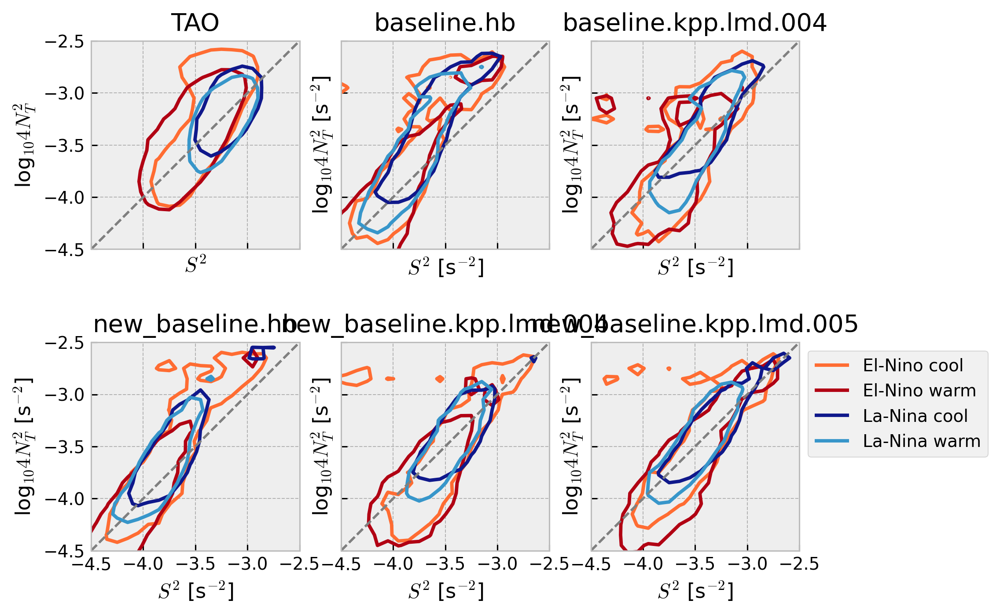

In [38]:
%autoreload

mixpods.plot_stability_diagram_by_dataset(tree, nrows=2)

### ε-Ri histograms

In [39]:
%autoreload

mixpods.map_hvplot(
    lambda dt, name, muted: mixpods.plot_eps_ri_hist(
        dt["eps_ri"].load(), label=name, muted=muted
    ),
    tree.children,
).opts(
    hv.opts.Curve(ylim=(1e-8, 3e-6)),
    hv.opts.GridSpace(show_legend=True),
    hv.opts.Overlay(show_grid=True, legend_position="bottom_left"),
    *mixpods.HV_TOOLS_OPTIONS,
)

/glade/u/home/dcherian/miniconda3/envs/pump/lib/python3.10/site-packages/holoviews/plotting/bokeh/plot.py:588: UserWarning: found multiple competing values for 'toolbar.active_drag' property; using the latest value
  plot = gridplot(plots[::-1],


:GridSpace   [enso_transition_phase]
   :Overlay
      .Curve.TAO                                                    :Curve   [Rig_T_bins]   (eps_ri)
      .Curve.Baseline_full_stop_hb                                  :Curve   [Rig_T_bins]   (eps_ri)
      .Curve.Baseline_full_stop_kpp_full_stop_lmd_full_stop_004     :Curve   [Rig_T_bins]   (eps_ri)
      .Curve.New_baseline_full_stop_hb                              :Curve   [Rig_T_bins]   (eps_ri)
      .Curve.New_baseline_full_stop_kpp_full_stop_lmd_full_stop_004 :Curve   [Rig_T_bins]   (eps_ri)
      .Curve.New_baseline_full_stop_kpp_full_stop_lmd_full_stop_005 :Curve   [Rig_T_bins]   (eps_ri)